In [9]:
#FOR DATA MANIPULATION
import pandas as pd
import numpy as np

#FOR STATISTICS
from scipy.stats import gaussian_kde
from statsmodels.tsa.stattools import acf,pacf
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

#FOR VISUALISATIONS
import plotly.express as px
import plotly.subplots as pss
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

#FOR DATA
import yfinance as yf
from fredapi import Fred

#FOR MACHINE LEARNING
from sklearn.linear_model import LinearRegression,ARDRegression
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.model_selection import train_test_split
from statsmodels.tsa.ar_model import ar_select_order,AutoReg

In [10]:
def set_df(symbol: str,time:int,interval:str = '1d'):
    _t=yf.Ticker(symbol)
    _df=yf.download(tickers=symbol,interval="1d",period=f"{time
    }y")
    _df=_df.droplevel(level=1, axis=1)
    _df.drop(['Open', 'High', 'Low'], axis=1, inplace=True)
    _df['lreturns'] = np.log(_df['Close'] / _df['Close'].shift(1))
    _df['moving_avg_7d'] = _df['Close'].rolling(7).mean()
    _df['moving_avg_20d'] = _df['Close'].rolling(20).mean()
    _df['Volatility_20d']=_df['lreturns'].rolling(20).std()
    _df['Volatility_7d']=_df['lreturns'].rolling(7).std()

    return _t,_df

In [11]:
msft = 'MSFT'
nvda= 'NVDA'
msft_tick = yf.Ticker("MSFT")
msft_tick.balancesheet,msft_tick.calendar,msft_tick.cashflow

(                                                    2025-06-30    2024-06-30  \
 Ordinary Shares Number                            7.434159e+09  7.434139e+09   
 Share Issued                                      7.434159e+09  7.434139e+09   
 Net Debt                                          1.290900e+10  3.331500e+10   
 Total Debt                                        6.058800e+10  6.712700e+10   
 Tangible Book Value                               2.013660e+11  1.216600e+11   
 ...                                                        ...           ...   
 Cash Cash Equivalents And Short Term Investments  9.455500e+10  7.553100e+10   
 Other Short Term Investments                      6.431300e+10  5.721600e+10   
 Cash And Cash Equivalents                         3.024200e+10  1.831500e+10   
 Cash Equivalents                                  1.853100e+10  6.744000e+09   
 Cash Financial                                    1.171100e+10  1.157100e+10   
 
                          

In [12]:
msft_df = yf.download(tickers=msft, interval="1d", period="10y")
nvda_df = yf.download(tickers=nvda, interval="1d", period="10y")

In [13]:
msft_df=msft_df.droplevel(level=1, axis=1)
nvda_df = nvda_df.droplevel(level=1, axis=1)

In [14]:
fig=go.Figure()
fig.add_scatter(x=msft_df.index,y=msft_df['Close'],mode='markers+lines',name=msft,marker=dict(size=5,symbol='circle',color='white'))
fig.add_scatter(x=nvda_df.index,y=nvda_df['Close'],mode='markers+lines',name=nvda,marker=dict(size=5,symbol='circle',color='blue'))
fig.update_layout(title=msft+' & '+nvda+' 3y',xaxis_title='Date',yaxis_title='Price',showlegend=True)
fig.show()


In [15]:
fig=go.Figure()
fig.add_scatter3d(x=nvda_df.index,y=nvda_df['Close'],z=nvda_df['Volume'],mode='lines',name=nvda)
fig.update_layout(title=nvda+' 3y',xaxis_title='Date',yaxis_title='Price',showlegend=True)
fig.show()

In [16]:
fig=go.Figure()
fig.add_scatter3d(x=msft_df.index,y=msft_df['Close'],z=msft_df['Volume'],mode='lines',name=msft)
fig.update_layout(title=msft+' & 3y',xaxis_title='Date',yaxis_title='Price',showlegend=True)
fig.show()

In [17]:
fig=go.Figure()
fig.add_candlestick(x=msft_df.index,close=msft_df['Close'],low=msft_df['Low'],high=msft_df['High'],open=msft_df['Open'],name=msft)
fig.add_candlestick(x=nvda_df.index,close=nvda_df['Close'],low=nvda_df['Low'],high=nvda_df['High'],open=nvda_df['Open'],name=nvda)
fig.add_annotation(y=msft_df.max()['High'],x=msft_df['High'].idxmax(),text="Highest Price of MSFT",showarrow=True,arrowcolor='white',arrowwidth=2,arrowsize=1,arrowhead=4)
fig.add_annotation(y=msft_df.min()['Low'],x=msft_df['Low'].idxmin(),text="Lowest Price of MSFT",showarrow=True,arrowcolor='white',arrowwidth=2,arrowsize=1,arrowhead=4)
fig.add_annotation(y=nvda_df.max()['High'],x=nvda_df['High'].idxmax(),text="Highest Price of NVDA",showarrow=True,arrowcolor='white',arrowwidth=2,arrowsize=1,arrowhead=4)
fig.add_annotation(y=nvda_df.min()['Low'],x=nvda_df['Low'].idxmin(),text="Lowest Price of NVDA",showarrow=True,arrowcolor='white',arrowwidth=2,arrowsize=1,arrowhead=4)
fig.update_layout(title=msft+' & '+nvda+' 3y',xaxis_title='Date',yaxis_title='Price',showlegend=True)
fig.show()

In [18]:
msft_df.describe()

Price,Close,High,Low,Open,Volume
count,2515.000000,2515.000000,2515.000000,2515.000000,2.515000e+03
mean,230.347617,232.453973,228.054266,230.319904,2.739735e+07
std,140.139557,141.302776,138.915317,140.185248,1.236061e+07
min,42.911072,43.549024,42.565515,43.345242,5.855900e+06
25%,98.448048,99.773393,97.459076,98.394784,1.964120e+07
50%,225.064713,227.869560,222.301195,225.458106,2.427150e+07
75%,329.577454,331.913865,326.403958,329.385511,3.136405e+07
max,539.825195,552.242002,538.530591,552.023241,1.335030e+08


In [19]:
msft_df.drop(['Open','High','Low'],axis=1,inplace=True)

In [20]:
msft_df['lreturns']=np.log(msft_df['Close']/msft_df['Close'].shift(1))

In [21]:
nvda_df['lreturns']=np.log(nvda_df['Close']/nvda_df['Close'].shift(1))

In [22]:
msft_df['moving_avg_7d'] = msft_df['Close'].rolling(7).mean()
msft_df['moving_avg_20d'] = msft_df['Close'].rolling(20).mean()

In [23]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['moving_avg_7d'],mode='lines',name=msft+' moving avg 7d'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['moving_avg_20d'],mode='lines',name=msft+' moving avg 20d'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Close'],mode='lines',name=msft))
fig.show()

In [24]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['lreturns'],mode='lines',name=msft+' log returns',yaxis='y2'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Close'],mode='lines',name=msft,yaxis='y1'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['moving_avg_7d'],mode='lines',name=msft+' moving avg 7d',yaxis='y1'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['moving_avg_20d'],mode='lines',name=msft+' moving avg 20d',yaxis='y1'))
fig.update_layout(yaxis=dict(overlaying='y2', side='right'),xaxis_title='Date',yaxis_title='Price',showlegend=True)
fig.show()

In [25]:
msft_df['Volatility_20d']=msft_df['lreturns'].rolling(20).std()
msft_df['Volatility_7d']=msft_df['lreturns'].rolling(7).std()

In [26]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Volatility_7d'],mode='lines',name=msft+' 7d volatility'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Volatility_20d'],mode='lines',name=msft+" 20d volatility"))
fig.show()

In [27]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Close'],mode='lines',name=msft,yaxis='y1'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Volatility_7d'],mode='lines',name=msft+' 7d volatility',yaxis='y2'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Volatility_20d'],mode='lines',name=msft+" 20d volatility",yaxis='y2'))
fig.update_layout(yaxis=dict(overlaying='y2',side='right'))
fig.show()

In [28]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['lreturns'],mode='lines',name=msft+' log returns',yaxis='y1'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Volatility_7d'],mode='lines',name=msft+' 7d volatility',yaxis='y2'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Volatility_20d'],mode='lines',name=msft+" 20d volatility",yaxis='y2'))
fig.update_layout(yaxis=dict(overlaying='y2',side='right'))
fig.show()

In [29]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['moving_avg_7d'],mode='lines',name=msft+' moving avg 7d',yaxis='y1'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Volatility_7d'],mode='lines',name=msft+' 7d volatility',yaxis='y2'))
fig.update_layout(yaxis=dict(overlaying='y2',side='right'))
fig.show()

In [30]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['moving_avg_20d'],mode='lines',name=msft+' moving avg 20d',yaxis='y1'))
fig.add_trace(go.Scatter(x=msft_df.index,y=msft_df['Volatility_20d'],mode='lines',name=msft+" 20d volatility",yaxis='y2'))
fig.update_layout(yaxis=dict(overlaying='y2',side='right'))
fig.show()

In [31]:
fig=go.Figure()
fig.add_trace(go.Scatter3d(x=msft_df.index,y=msft_df['Close'],z=msft_df['Volatility_7d'],mode='lines',name=msft+ ' Volatility 7d'))
fig.add_trace(go.Scatter3d(x=msft_df.index,y=msft_df['Close'],z=msft_df['Volatility_20d'],mode='lines',name=msft+ ' Volatility 20d'))
fig.show()

In [32]:
fig=go.Figure()
fig.add_trace(go.Histogram(x=msft_df['Volatility_7d'],nbinsx=40,histnorm='probability density',name='Volatility_7d'))
kde = gaussian_kde(msft_df['Volatility_7d'].dropna())
x_range=np.linspace(msft_df['Volatility_7d'].min(), msft_df['Volatility_7d'].max(), 1000)
y = kde(x_range)
fig.add_trace(go.Scatter(x=x_range,y=y,mode='lines',name='KDE'))
fig.show()

In [33]:
fig=go.Figure()
fig.add_trace(go.Histogram(x=msft_df['Volatility_20d'],nbinsx=40,histnorm='probability density',name='Volatility_20d'))
kde = gaussian_kde(msft_df['Volatility_20d'].dropna())
x_range=np.linspace(msft_df['Volatility_20d'].min(), msft_df['Volatility_20d'].max(), 1000)
y = kde(x_range)
fig.add_trace(go.Scatter(x=x_range,y=y,mode='lines',name='KDE'))
fig.show()

In [34]:
fred_api_path=open(r"C:\Users\Asus\Documents\Skills\Python\Sentiment Analysis\Fred.txt")
api=fred_api_path.read()
fred=Fred(api_key=api)

In [35]:
sp_500=fred.get_series(series_id='SP500')
unp=fred.get_series('unrate')

In [36]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=unp.index,y=unp,yaxis='y1',name='Unemployment Rate'))
fig.add_trace(go.Scatter(x=sp_500.index,y=sp_500,yaxis='y2',name="S&P 500"))
fig.update_layout(xaxis_rangeslider_visible=True,xaxis_title='Year',title='Unemployment Rate',yaxis_title='Percentage',yaxis=dict(side='right',overlaying='y2'))
fig.show()

In [37]:
apl,apl_df=set_df('AAPL',1,'1d')

In [38]:
apl_df.head()

Price,Close,Volume,lreturns,moving_avg_7d,moving_avg_20d,Volatility_20d,Volatility_7d
Date,,,,,,,
2025-03-21,217.322815,94127800,NaN,NaN,NaN,NaN,NaN
2025-03-24,219.772141,44299500,0.011207,NaN,NaN,NaN,NaN
2025-03-25,222.779037,34493600,0.013589,NaN,NaN,NaN,NaN
2025-03-26,220.568649,34466100,-0.009971,NaN,NaN,NaN,NaN
2025-03-27,222.878586,37094800,0.010418,NaN,NaN,NaN,NaN


In [39]:
acf_vals = acf(apl_df['lreturns'].dropna(), nlags=40)

In [40]:
fig=go.Figure()
fig.add_trace(go.Bar(x=[i for i in range(1,40)],y=acf_vals[1:],name='ACF'))
fig.show()

In [41]:
acf_apl=acf(x=apl_df['lreturns'].dropna(),nlags=50)
pacf_apl=pacf(x=apl_df['lreturns'].dropna(),nlags=50)
pacf_apl

array([ 1.00000000e+00,  5.47156234e-02,  1.00853274e-01, -1.05272851e-01,
       -1.18423080e-01, -8.90385096e-02, -3.07012547e-02, -9.25798348e-02,
       -6.89169157e-02,  2.72244617e-02, -5.05770463e-02, -5.63500039e-02,
        1.40506358e-02,  3.63021307e-03, -1.82077404e-02,  8.03147038e-03,
       -7.43551033e-02, -6.91134230e-02,  7.93074888e-03,  3.68822119e-02,
        1.26144436e-01, -5.05322426e-02,  7.42015966e-04, -5.97104583e-02,
        1.74722689e-02,  7.18919381e-03,  2.67352885e-04,  2.03718011e-02,
       -1.73838138e-02, -2.39179148e-02,  9.70394120e-02, -2.33507425e-02,
        6.23225207e-02,  3.64318628e-02, -2.89820227e-02,  2.84933308e-02,
        5.79338694e-03,  6.14611185e-02,  9.08809700e-03, -5.83053203e-02,
        3.30656779e-02, -3.69814057e-02,  2.47909544e-02,  4.64235479e-03,
       -2.08744343e-02,  4.78060986e-03,  6.71947940e-02,  7.40552271e-02,
        4.21906137e-02,  1.07528181e-01, -1.73810712e-02])

In [42]:
acf_apl

array([ 1.        ,  0.05449676,  0.10271678, -0.09215839, -0.11407782,
       -0.11649662, -0.05362248, -0.09018252, -0.04677106,  0.0338454 ,
       -0.01921279, -0.00750804,  0.03089879,  0.01646071,  0.00981319,
        0.0264298 , -0.06581083, -0.06052645, -0.00473654,  0.02692102,
        0.13032023, -0.00256042,  0.02991775, -0.0730031 ,  0.00315131,
       -0.02963443, -0.00223056,  0.00929368, -0.00681369, -0.00878204,
        0.07085796, -0.02149383,  0.06653006,  0.03053277, -0.01194552,
        0.00877341, -0.03290061,  0.00808084, -0.01390587, -0.02545394,
        0.01720659, -0.03911752,  0.02401011, -0.02667743,  0.00110918,
        0.00337691,  0.06090732,  0.05918363,  0.03703542,  0.07712398,
       -0.01616339])

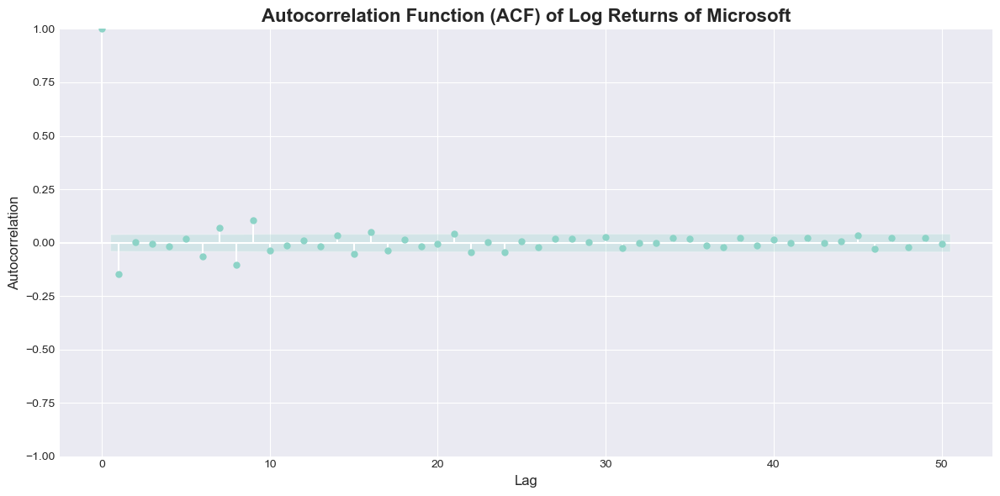

In [43]:
plt.style.use('seaborn-v0_8-darkgrid')

fig, ax = plt.subplots(figsize=(12, 6))

plot_acf(msft_df['lreturns'].dropna(),lags=50,alpha=0.05,bartlett_confint=True,ax=ax)

ax.set_title("Autocorrelation Function (ACF) of Log Returns of Microsoft", fontsize=16, weight='bold')
ax.set_xlabel("Lag", fontsize=12)
ax.set_ylabel("Autocorrelation", fontsize=12)

plt.tight_layout()
plt.show()

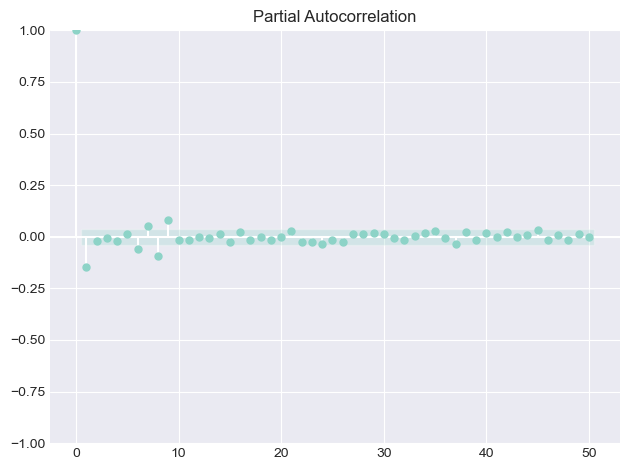

In [44]:
plot_pacf(msft_df['lreturns'].dropna(),lags=50,alpha=0.05,use_vlines=1)
ax.set_title("Partial Autocorrelation Function (PACF) of Log Returns of Microsoft", fontsize=16, weight='bold')
ax.set_xlabel("Lag", fontsize=12)
ax.set_ylabel("Partial Autocorrelation", fontsize=12)
plt.tight_layout()
plt.show()

In [45]:
msft_df.dropna(subset=['lreturns'],inplace=True)
msft_df.head()

Price,Close,Volume,lreturns,moving_avg_7d,moving_avg_20d,Volatility_20d,Volatility_7d
Date,,,,,,,
2016-03-22,47.575607,23124100,0.003891,NaN,NaN,NaN,NaN
2016-03-23,47.487610,20129000,-0.001851,NaN,NaN,NaN,NaN
2016-03-24,47.698795,19950000,0.004437,NaN,NaN,NaN,NaN
2016-03-28,47.109264,17025100,-0.012436,NaN,NaN,NaN,NaN
2016-03-29,48.138729,23924300,0.021617,NaN,NaN,NaN,NaN


In [46]:
train=msft_df.iloc[:int(-0.3*len(msft_df)),2]
test=msft_df.iloc[int(-0.3*len(msft_df)):,2]
selector=ar_select_order(train,50)
test

Date
2023-03-20   -0.026104
2023-03-21    0.005678
2023-03-22   -0.005457
2023-03-23    0.019530
2023-03-24    0.010426
                ...   
2026-03-16    0.011062
2026-03-17   -0.001351
2026-03-18   -0.019262
2026-03-19   -0.007095
2026-03-20   -0.018603
Name: lreturns, Length: 754, dtype: float64

In [47]:
model=AutoReg(train,selector.ar_lags).fit()

C:\Users\Asus\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



In [48]:
res=pd.DataFrame(model.forecast(len(test)),columns=['Forecast'])
res.set_index(test.index,inplace=True)
res['true']=test
res['residual']=res['true']-res['Forecast']
res.head()

,Forecast,true,residual
Date,,,
2023-03-20,-0.000969,-0.026104,-0.025135
2023-03-21,0.001354,0.005678,0.004323
2023-03-22,0.000926,-0.005457,-0.006383
2023-03-23,0.001005,0.019530,0.018525
2023-03-24,0.000990,0.010426,0.009436


In [49]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=train.index,y=train,mode='lines',name='Train'))
fig.add_trace(go.Scatter(x=test.index,y=test,mode='lines',name='Test'))
fig.add_trace(go.Scatter(x=res.index,y=res['Forecast'],mode='lines',name='Forecast'))
fig.show()
#with static no significant forecast is done approach is also wrong since we are cheating by using prices we dont know that exist instead rolling prediction is better

In [50]:
del res

In [51]:
predictions = []

# history starts as training data
history = list(train)

for t in range(len(test)):
    # refit model on current history
    model = AutoReg(history, lags=selector.ar_lags).fit()
    # forecast one step ahead
    pred = model.forecast(steps=1)[0]
    predictions.append(pred)
    # add actual value to history
    history.append(test.iloc[t])

res = pd.DataFrame(predictions, columns=['Forecast'], index=test.index)
res['true'] = test
res['residual'] = res['true'] - res['Forecast']

In [52]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=train.index,y=train,mode='lines',name='Train'))
fig.add_trace(go.Scatter(x=train.index,y=model.fittedvalues))
fig.show()

In [56]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=train.index,y=train,mode='lines',name='Train'))
fig.add_trace(go.Scatter(x=res.index,y=res['true'],mode='lines',name='Test'))
fig.add_trace(go.Scatter(x=res.index,y=res['Forecast'],mode='lines',name='Forecast'))
fig.add_trace(go.Scatter(x=train.index,y=model.fittedvalues,mode='lines'))
fig.show()

In [54]:
dir(model)

['__annotations__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_ar_lags',
 '_cache',
 '_data_attr',
 '_data_in_cache',
 '_df_model',
 '_get_robustcov_results',
 '_get_wald_nonlinear',
 '_hold_back',
 '_lag_repr',
 '_max_lag',
 '_n_totobs',
 '_nobs',
 '_params',
 '_plot_predictions',
 '_summary_text',
 '_transform_predict_exog',
 '_use_t',
 'aic',
 'aicc',
 'append',
 'apply',
 'ar_lags',
 'arfreq',
 'bic',
 'bse',
 'conf_int',
 'cov_params',
 'cov_params_default',
 'data',
 'df_model',
 'df_resid',
 'diagnostic_summary',
 'f_test',
 'fittedvalues',
 'forecast',
 'fpe',
 'get_prediction',
 'hqic',
 'initialize',
 'llf',
 'load',
 'model',
 'nobs',

In [55]:
model.summary()
#model is significant but weak predictability

<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                      y   No. Observations:                 2513
Model:                     AutoReg(1)   Log Likelihood                6710.176
Method:               Conditional MLE   S.D. of innovations              0.017
Date:                Mon, 23 Mar 2026   AIC                         -13414.351
Time:                        16:06:39   BIC                         -13396.865
Sample:                             1   HQIC                        -13408.004
                                 2513                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0010      0.000      2.871      0.004       0.000       0.002
y.L1          -0.1468      0.020     -7.440      0.000      -0.186      -0.108
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -6.8101           +0.0000j            6.8101            0.5000
-----------------------------------------------------------------------------
"""